In [2]:
import pandas as pd
idx = pd.IndexSlice


%matplotlib inline
import pylab as plt
plt.style.use('fivethirtyeight')

import sqlite3
conn = sqlite3.connect('../data/pubg/pubg_sample.db')

In [3]:
deaths = pd.read_sql('SELECT * FROM deaths LIMIT 5000', conn)

In [5]:
import altair as alt
alt.renderers.enable('notebook')

RendererRegistry.enable('notebook')

In [6]:
deaths.head(3)

,index,killed_by,killer_name,killer_placement,killer_position_x,killer_position_y,map,match_id,time,victim_name,victim_placement,victim_position_x,victim_position_y
0,0,UMP9,bigjj321,5.0,332478.2,533202.6,ERANGEL,2U4GBNA0YmmYVKQqfjTRvzroK1jWy0P_Ekt9jDJjdzJ8_g...,747,unbertakerP,3.0,330715.8,532682.2
1,1,Bluezone,None,NaN,NaN,NaN,ERANGEL,2U4GBNA0YmnpTzelHSxoLknOT8Wco_qaNyOFz53xi7X7Em...,1487,Your-Old-Iron,82.0,0.0,0.0
2,2,M16A4,StolenV91,24.0,520532.2,467115.6,ERANGEL,2U4GBNA0YmlVfjiMYDoLjs98iK0X1fFCQtmxh9XIAXWJ4l...,504,sasadezx,33.0,520822.9,467389.5


# deaths, timevise

In [7]:
erangel = deaths[deaths.map == 'ERANGEL']

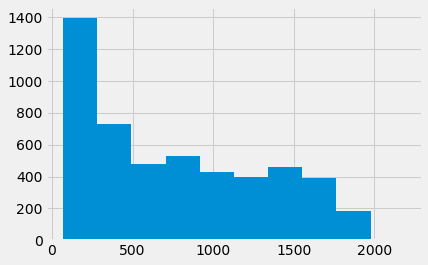

In [8]:
erangel['time'].hist()

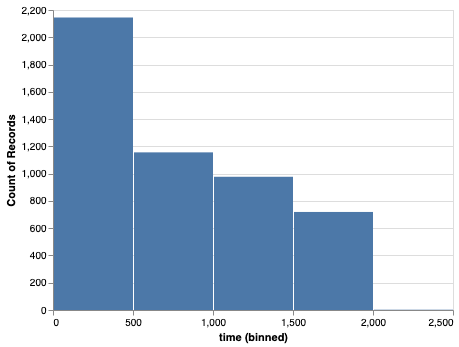

In [9]:
alt.Chart(erangel).mark_bar().encode(
    alt.X("time:Q", bin=True),
    y='count()'
)

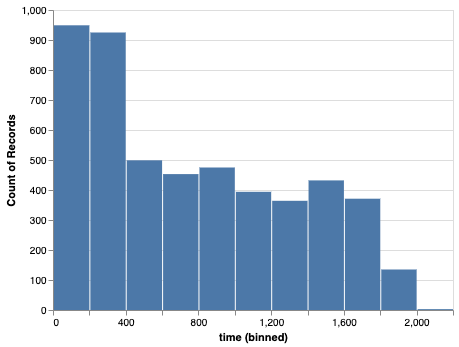

In [10]:
alt.Chart(erangel).mark_bar().encode(
    x=alt.X("time:Q", bin=alt.Bin(maxbins=20)),
    y='count()'
)

# map

In [11]:
import json
with open('./weapon_type.json', 'r') as f:
    w_types = json.load(f)

In [12]:
wt_inverse = {v:k for k, collection in w_types.items() for v in collection}

In [13]:
erangel['weapon_type'] = erangel['killed_by'].map(wt_inverse)

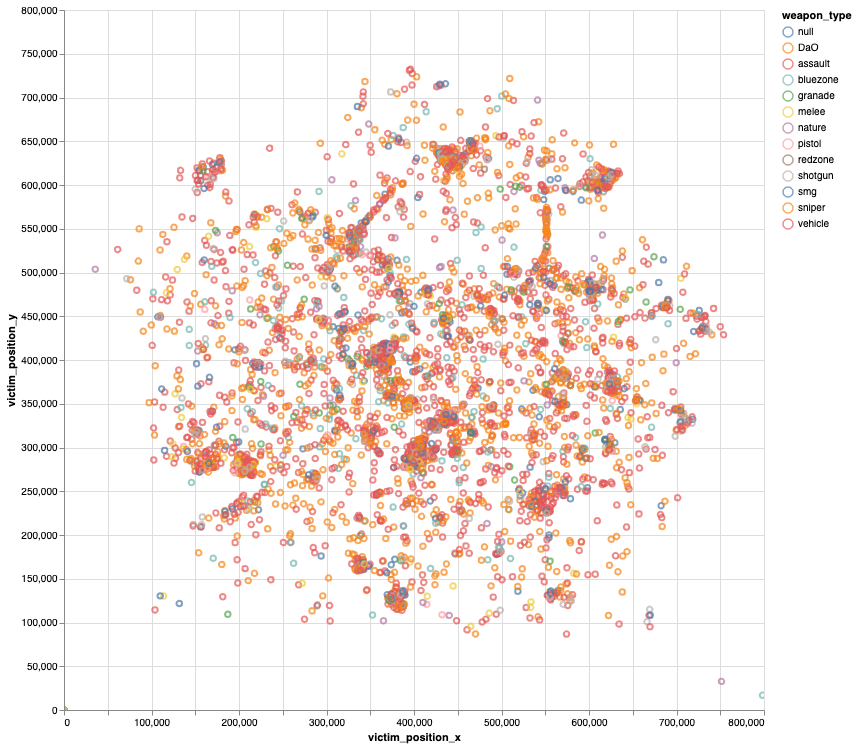

In [14]:
alt.Chart(erangel).mark_point().encode(
    x='victim_position_x',
    y='victim_position_y',
    color='weapon_type',
    tooltip=['killed_by', 'time', 'killer_placement']
).interactive().properties(
    width=700,
    height=700
)

# Combine

In [15]:
base = alt.Chart(erangel).mark_bar().encode(
    alt.X("time:Q", bin=alt.Bin(maxbins=50)),
    y='count()'
).properties(width=700, height=100)


# blue background with selection
brush = alt.selection(type='interval', encodings=['x'])
background = base.add_selection(brush)

# yellow highlights on the transformed data
highlight = base.encode(
    color=alt.value('goldenrod')
).transform_filter(brush)

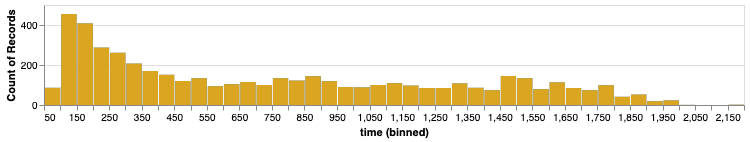

In [16]:
hist = alt.layer(
    background,
    highlight,
    data=erangel
)

hist

In [17]:
map_ = alt.Chart(erangel).mark_point().encode(
    x='victim_position_x',
    y='victim_position_y',
    color='weapon_type',
    tooltip=['killed_by', 'time', 'killer_placement']
).transform_filter(brush).interactive().properties(
    width=700,
    height=700
)

In [18]:
dashboard = alt.vconcat(map_, hist, data=erangel)

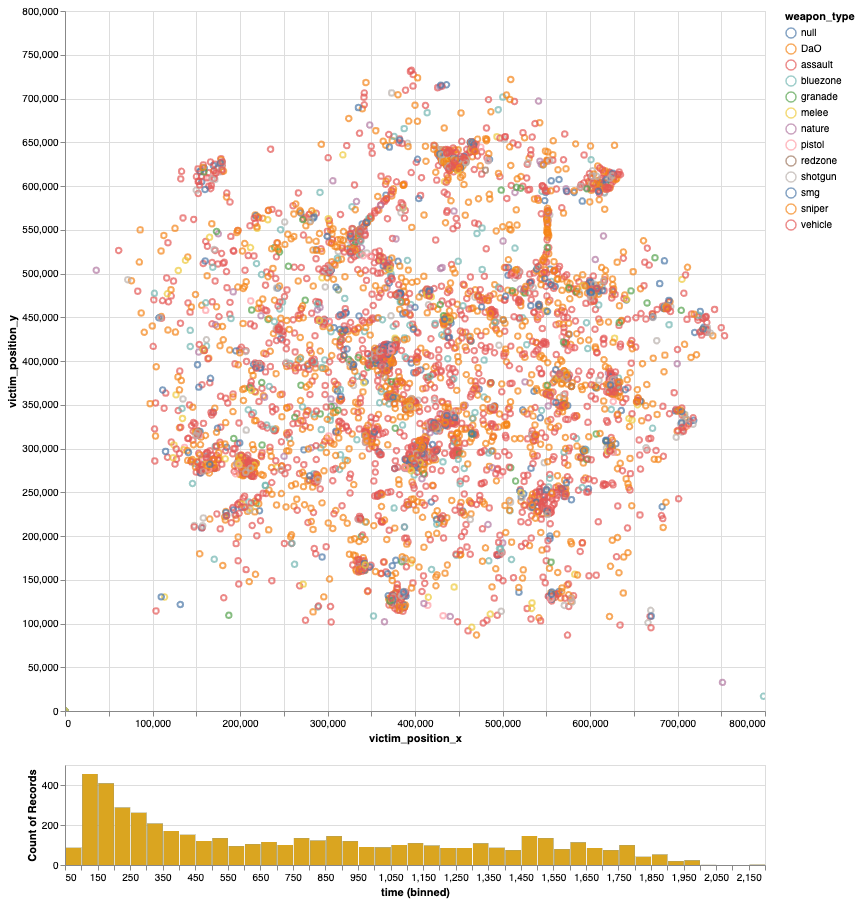

In [19]:
dashboard

In [20]:
dashboard.save('chart.html')